In [1]:
import pandas as pd
import numpy as np
import os
from IPython.display import Image


#Normality, Stats
from scipy.stats import kurtosis, skew, norm, spearmanr
from scipy.cluster import hierarchy

from pprint import pprint

#Data Imputation
from sklearn import linear_model

#Data Visualization
import plotly.express as px
import matplotlib.pyplot as plt
from matplotlib_venn import venn3
import plotly.graph_objects as go

#Data Analysis: Clustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

#Data Analysis: Corrective Mechanisms
from imblearn.over_sampling import SMOTE
from imblearn import under_sampling

#Data Analysis: Analytics + Performance
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from sklearn.model_selection import GridSearchCV, permutation_test_score
from sklearn.metrics import confusion_matrix, plot_confusion_matrix, classification_report, mean_absolute_error, mean_squared_error, roc_curve, roc_auc_score, precision_recall_curve, average_precision_score
from sklearn.ensemble import RandomForestClassifier

#Data Analysis: Interpretation 
import eli5
from eli5.sklearn import PermutationImportance

In [2]:
%config Completer.use_jedi = False

In [4]:
def percent_missing(df):
    """
    Quick way to visualize percent data missingness across the dataframe.

    Arguments:
        df (dataframe): the dataframe with the data of interest

    Returns:
        missing (dataframe): percentage of missing data across dataframe
    """
    missing = pd.DataFrame(df.isna().sum()/len(df)*100,columns=["Percent Missing Data"])
    missing = round(missing,3)
    return missing.sort_values(by='Percent Missing Data',ascending=False)

In [74]:
def aggregated_pie_chart(df, col):
    """
    For rough/quick EDA. Shows pie chart breakdown of top 10 values in a specific column. Bins other values into "Other" category if not in top 10.
    Helper function for rough_EDA.
    
    Arguments:
        df (dataframe): the dataframe with the data of interest
        col (str): the name of the column to aggregate

    Returns:
        fig: the pie chart (Plotly express)
    """
    a = df[col].value_counts(dropna=False)[:10].sort_values(ascending=False).to_frame()
    if df[col].value_counts(dropna=False)[10:].sum() > 0 :
        a = a.append(pd.DataFrame([df[col].value_counts(dropna=False)[10:].sum()],index=['Other'],columns=[col]))
    fig = px.pie(a,names=a[col].index,values=a[col].values,title=col,color_discrete_sequence=px.colors.qualitative.Safe)
    fig.show()
    file_name = "EDA_"+col.replace(" ", "_")+".png"
    fig.write_image(os.path.join("images/",file_name))
    return fig

In [75]:
def show_histogram(df, col):
    """
    For rough/quick EDA. Shows normalized histogram/distribution of specific column data in dataset
    Helper function for rough_EDA.
    
    Arguments:
        df (dataframe): the dataframe with the data of interest
        col (str): the name of the column to aggregate

    Returns:
        fig: the histogram (Plotly express)
    """
    fig = px.histogram(df,x=col,title=col,histnorm='percent')
    fig.show()
    file_name = "EDA_"+col.replace(" ", "_")+".png"
    fig.write_image(os.path.join("images/",file_name))
    return fig

In [7]:
def rough_EDA(df):
    """
    For rough/quick EDA. For ints/floats, shows normalized histogram/distribution; for objects/categorical data, shows aggregated pie chart
    Calls aggregated_pie_chart and show_histogram.
    
    Arguments:
        df (dataframe): the dataframe with the data of interest

    Returns:
        None
    """
    for col in df.columns:
        if 'ID' not in col:
            #we are not interested in columns that hold ID information, so we skip them
            if df.dtypes[col] == 'object' or df.dtypes[col] == 'string':
                aggregated_pie_chart(df,col)
                #TODO: make this better using .str.contains maybe
            elif df.dtypes[col] == 'float64' or df.dtypes[col] == 'int64':
                show_histogram(df,col)
        else:
            print(col, " not analyzed")

In [76]:
def quick_box_plot(df,col_to_color_by):
    for col in df.describe():
        if 'mutation' in col:
            pass
        else:
            fig = px.box(df, y=df[col],x=df['Cancer Type'], title=col, color=processed_data[col_to_color_by],points='outliers')
            fig.show()
            file_name = "BOXPLOT_"+ col.replace(" ", "_") + ".png"
            fig.write_image(os.path.join("images/",file_name))

In [8]:
#One hot encode PER feature where first value is dropped to avoid colinearity:
def get_dummies(df, list_cols_to_dummify):
    all_encoded_data = pd.DataFrame()
    for col in list_cols_to_dummify:
        specific_encoded_data = pd.get_dummies(df[col],drop_first=True)
        all_encoded_data = pd.concat([all_encoded_data, specific_encoded_data],axis=1)
    return all_encoded_data

In [77]:
def plot_multiclass_roc(clf, X_test, y_test, n_classes, figsize=(17, 6)):
    
    y_scores = clf.predict_proba(X_test)
    
    # structures
    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    fig = go.Figure()
    fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
    )
    
    # calculate dummies in order to plot
    y_onehot = pd.get_dummies(y_test, columns=clf.classes_)

    for i in range(y_scores.shape[1]):
        y_true = y_onehot.iloc[:, i]
        y_score = y_scores[:, i]

        fpr, tpr, _ = roc_curve(y_true, y_score)
        auc_score = roc_auc_score(y_true, y_score)

        name = f"{y_onehot.columns[i]} (AUC={auc_score:.2f})"
        fig.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

    fig.update_layout(
        title='MultiClass ROC/AUC',
        xaxis_title='False Positive Rate',
        yaxis_title='True Positive Rate (Recall)',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        width=700, height=500
    )
    fig.show()
    file_name = "MULTICLASS_ROC_"+str(clf_rf.base_estimator_)[:-2]+"_"+str(n_classes)+"_classes.png"
    fig.write_image(os.path.join("images/",file_name))

In [89]:
def plot_multiclass_PR_curve(clf, X_test, y_test, n_classes, figsize=(17, 6)):
    
    y_scores = clf.predict_proba(X_test)
    y_onehot = pd.get_dummies(y_test, columns=clf_rf.classes_)

    # Create an empty figure, and iteratively add new lines
    # every time we compute a new class
    fig = go.Figure()
    fig.add_shape(
        type='line', line=dict(dash='dash'),
        x0=0, x1=1, y0=1, y1=0
    )

    for i in range(y_scores.shape[1]):
        y_true = y_onehot.iloc[:, i]
        y_score = y_scores[:, i]

        precision, recall, _ = precision_recall_curve(y_true, y_score)
        auc_score = average_precision_score(y_true, y_score)

        name = f"{y_onehot.columns[i]} (AP={auc_score:.2f})"
        fig.add_trace(go.Scatter(x=recall, y=precision, name=name, mode='lines'))

    fig.update_layout(
        xaxis_title='Recall',
        yaxis_title='Precision',
        yaxis=dict(scaleanchor="x", scaleratio=1),
        xaxis=dict(constrain='domain'),
        width=700, height=500
    )
    fig.show()
    file_name = "MULTICLASS_PR_CURVE_"+str(clf_rf.base_estimator_)[:-2]+"_"+str(n_classes)+"_classes.png"
    fig.write_image(os.path.join("images/",file_name))

In [96]:
def plot_feature_importances(feature_importances):
    fig = px.bar(feature_importances,x=feature_importances.index,y='Importance',color=feature_importances.index)
    fig.update_xaxes(tickangle=45)
    fig.update_layout(autosize=False,
        title='Feature Importance: All Features',
        width=1600,
        height=800,)
    fig.show()
    file_name = "FEAT_IMPORTANCE_"+str(clf_rf.base_estimator_)[:-2]+".png"
    fig.write_image(os.path.join("images/",file_name))

In [109]:
def show_correlated_top_features(feature_importances):
    top = feature_importances.sort_values(by='Importance',ascending=False).head(15).index.tolist()
    spearman_corr = spearmanr(data_for_ml[top]).correlation
    test = round(data_for_ml[top].corr(method='spearman'),2)
    mask = np.triu(np.ones_like(spearman_corr,dtype=np.bool))

    fig = px.imshow(test, text_auto=True,color_continuous_scale='Aggrnyl')
    fig.update_layout(autosize=False,
        width=800,
        height=600,)
    fig.show()
    file_name = "TOP_FEATS_CORR_MATRIX_"+str(clf_rf.base_estimator_)[:-2]+".png"
    fig.write_image(os.path.join("images/",file_name))

In [78]:
os.chdir('/home/erin/github/DS_public_data/01_MSK_MetTropism')

if not os.path.exists("images"):
    os.mkdir("images")

In [11]:
#Read in data
kras = pd.read_csv('data/msk_met_2021_clinical_data-KRAS.tsv',sep='\t')
tp53 = pd.read_csv('data/msk_met_2021_clinical_data-TP53.tsv',sep='\t')
apc = pd.read_csv('data/msk_met_2021_clinical_data-APC.tsv',sep='\t')

In [12]:
print("KRAS DATA", kras.shape)
print("APC DATA", apc.shape)
print("TP53 DATA", tp53.shape)

KRAS DATA (5446, 55)
APC DATA (3643, 55)
TP53 DATA (18147, 55)


In [13]:
apc['APC_mutation'] = 1.0
kras['KRAS_mutation'] = 1.0
tp53['TP53_mutation'] = 1.0

In [14]:
#merge all datasets 
tp53_apc = pd.merge(tp53,apc,how='outer')
raw_data = pd.merge(tp53_apc,kras,how='outer')
raw_data[['TP53_mutation', 'APC_mutation','KRAS_mutation']] = raw_data[['TP53_mutation','APC_mutation','KRAS_mutation']].fillna(value=0)
raw_data.head()

,Study ID,Patient ID,Sample ID,Age at Death,Age at First Mets Dx,Age at Last Contact,Age at Sequencing,Age at Surgical Procedure,Cancer Type,Cancer Type Detailed,...,Sample coverage,Sample Type,Sex,Subtype,Subtype Abbreviation,TMB (nonsynonymous),Tumor Purity,TP53_mutation,APC_mutation,KRAS_mutation
0,msk_met_2021,P-0000004,P-0000004-T01-IM3,40.06,39.66,NaN,39.74,37.03,Breast Cancer,Breast Invasive Ductal Carcinoma,...,428,Primary,Female,Breast Ductal HR+HER2-,IDC HR+HER2-,4.436621,50.0,1.0,0.0,0.0
1,msk_met_2021,P-0000015,P-0000015-T01-IM3,45.60,44.25,NaN,44.44,44.42,Breast Cancer,Breast Invasive Ductal Carcinoma,...,281,Metastasis,Female,Breast Ductal HR+HER2-,IDC HR+HER2-,7.764087,40.0,1.0,0.0,0.0
2,msk_met_2021,P-0000025,P-0000025-T02-IM5,76.53,69.65,NaN,74.81,74.64,Endometrial Cancer,Uterine Serous Carcinoma/Uterine Papillary Ser...,...,1147,Metastasis,Female,Uterine Serous,UCEC SEROUS,1.957439,30.0,1.0,0.0,0.0
3,msk_met_2021,P-0000026,P-0000026-T01-IM3,NaN,68.41,78.43,71.72,71.58,Endometrial Cancer,Uterine Endometrioid Carcinoma,...,1222,Metastasis,Female,Uterine Endometrioid,UCEC ENDO,4.436621,10.0,1.0,0.0,0.0
4,msk_met_2021,P-0000027,P-0000027-T01-IM3,82.03,79.50,NaN,81.00,79.50,Mesothelioma,"Pleural Mesothelioma, Epithelioid Type",...,668,Primary,Female,Pleural Mesothelioma,PLMESO,0.000000,NaN,1.0,0.0,0.0


In [15]:
#Data Processing: Data Missingness and Processing for ML 

In [16]:
percent_missing(raw_data).head(5)

,Percent Missing Data
Metastatic Site,59.608
Age at Death,58.131
Age at Last Contact,42.244
Age at First Mets Dx,22.208
Age at Surgical Procedure,3.367


In [17]:
mask = [x for x in raw_data['Primary Tumor Site'].value_counts().head(10).index]
processed_data = raw_data.loc[raw_data['Primary Tumor Site'].isin(mask)]

#where age at death is missing I notice the patient is still alive (Overall patient status column) 
#so I will fillna with 99 in these cases to denote that the tumor or met does not appear to have a strong impact on longevity
#TODO: make sure this is shown in scatterplot/heatmap

processed_data['Age at Death'] = processed_data['Age at Death'].fillna(99)

#Metastatic site is missing ~60% of the time -- this is important and too much missing data to impute. Therefore I will drop this column and metastasis-adjacent columns,
#including:
#'Metastatic Site'
#'Age at First Mets Dx'
#'Age at Last Contact'
processed_data = processed_data.drop(columns=['Metastatic Site','Age at First Mets Dx','Age at Last Contact','Tumor Purity'])
#TODO: prove that Tumor Purity is not an important feature
#Will also drop data in which 'Age at Sequencing' and 'Age at Surgical Procedure' are both NA (in which there are very few)
processed_data = processed_data.dropna(subset=['Age at Sequencing', 'Age at Surgical Procedure', 'Overall Survival (Months)'])
percent_missing(processed_data).head(5)


/home/erin/miniconda3/envs/superML_3.7/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Percent Missing Data
Race Category,0.198
Study ID,0.000
Overall Survival (Months),0.000
FGA,0.000
Fraction Genome Altered,0.000


In [18]:
#PREAMBLE: 
#Difficult to intuitively understand the best course of action here. for the purposes of a preliminary ML model
#that has no clinical or research impact (e.g., it is for my learning only), I will 
#aggregate values 'Pt refused to answer', 'No value entered', 'Unknown', and 'NaN' into 'Other'.
#There is not enough diversity here to do the findings justice, but this aggregation will at least 
#allow all other data to be included (so even though the model is blind to the race category in those cases, 
#the mutation data is still being incorporated/represented into the training set. Howevver, in the future it could be
#beneficial to understand the fairness disparity here -- I could potentially test Random Under Sampling of the categories
#with majority of the data points, or try and use SMOTE to see if I can impute missing data based on race.

#TODO: test ROS/RUS/SMOTE based on demographics? 
#TODO: try Aequitas tool to better understand biases in the data
processed_data['Race Category'].value_counts(dropna=False)

White                             10419
Asian-far east/indian subcont       872
Black or african american           809
Pt refused to answer                419
Other                               300
No value entered                    192
Unknown                              64
NaN                                  26
Native american-am ind/alaska        17
Native hawaiian or pacific isl        8
Name: Race Category, dtype: int64

In [19]:
demo_rollup = {"Pt refused to answer" : 'Other', "No value entered" : 'Other', "Unknown": 'Other', "NaN" : 'Other'}
processed_data = processed_data.replace({"Race Category": demo_rollup})

In [79]:
rough_EDA(processed_data)

FileNotFoundError: [Errno 2] No such file or directory: 'images/EDA_Distant_Mets:_Bladder/UT.png'

In [80]:
quick_box_plot(processed_data,'Cancer Type')

In [41]:
processed_data = processed_data.drop(columns=['Study ID', 'Patient ID', 'Sample ID','Subtype Abbreviation','Gene Panel','Oncotree Code','Primary Tumor Site','Number of Samples Per Patient','Cancer Type Detailed','FGA', 'Age at Sequencing'])
#TODO: compare Primary Tumor Site with Organ System as predictive features
#TODO: come back to EDA to see if clustering algorithms can differentiate between entries in Cancer Type Detailed

In [42]:
distant_mets = pd.get_dummies(processed_data.loc[:,'Distant Mets: Adrenal Gland':'Distant Mets: Unspecified'])
list_to_keep = [col for col in distant_mets.columns if '_Yes' in col]
distant_mets = distant_mets[list_to_keep]

In [43]:
other_dummified_data = get_dummies(processed_data, ['Sex','Overall Survival Status','Sample Type','MSI Type'
                            ,'Race Category'])

In [44]:
#df.describe() uses just numerical columns, so I grab .columns off of this to get int/floats to pair with categorical data
data_for_ml = pd.concat([processed_data[list(processed_data.describe().columns)],distant_mets,other_dummified_data,processed_data['Organ System']],axis=1)


In [45]:
#Scaling:
#StandardScaler is useful for the features that follow a Normal distribution:
#'Age at Death', 
#'Age at Sequencing', 
#'Age at Surgical Procedure'
#'Sample coverage',

#Normalization
#Normalization refers to the rescaling of the features to a range of [0, 1], which is a special case of min-max scaling.

#'FGA',
#'Fraction Genome Altered', 'Met Count', 'Met Site Count', 'MSI Score',
#'Mutation Count', 'Overall Survival (Months)', 
#'TMB (nonsynonymous)'

#Standardization
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#I tested out both Standard and MinMax Scaler for this list of columns and there appeared to be no significant difference in the results
sc = StandardScaler()
mmscaler = MinMaxScaler()

cols = ['Age at Death','Age at Surgical Procedure', 'Sample coverage',
'Fraction Genome Altered', 'Met Count', 'Met Site Count', 'MSI Score',
'Mutation Count', 'Overall Survival (Months)', 'TMB (nonsynonymous)']
data_for_ml[cols] = mmscaler.fit_transform(data_for_ml[cols])


In [46]:
data_for_ml_top_organs = data_for_ml['Organ System'].value_counts().head(6).index.tolist()
data_for_ml = data_for_ml.loc[data_for_ml['Organ System'].isin(data_for_ml_top_organs)]

In [47]:
#data_for_ml.loc[data_for_ml['Organ System']]
X = data_for_ml.drop(columns=['Organ System'])

y = data_for_ml['Organ System']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33,random_state=4242)

print(X.shape)
print(X_train.shape)
print(y_train.shape)

(12454, 45)
(8344, 45)
(8344,)


In [49]:
# Create the parameter grid based on the results of random search 
param_grid = {
    'bootstrap': [True],
    'max_depth': [None, 50, 100, 150],
    'max_features': ["auto", "sqrt", "log2"],
    'min_samples_leaf': [.1,.5, 1, 2, 4],
    'min_samples_split': [.1, .5, 2, 4],
    'n_estimators': [100, 300, 1000]
}
# Create a based model
rf = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = rf, param_grid = param_grid, 
                          cv = 3, n_jobs = -1, verbose = 2)

In [50]:
grid_search.fit(X_train,y_train)
grid_search.best_params_
best_grid = grid_search.best_estimator_


Fitting 3 folds for each of 720 candidates, totalling 2160 fits
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=300; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=1000; total time=   8.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=300; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=300; total time=   3.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_s

[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.2s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=1000; total time=   8.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=300; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   6.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=1000; total time=   8.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=1000; total time=  22.2s
[CV] END bootstra

[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=0.1, n_estimators=300; total time=   3.4s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=1000; total time=   8.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  11.6s
[CV] END bootstrap=

[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=0.1, n_estimators=300; total time=   3.5s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=1000; total time=   8.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=300; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=300; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  11.0s
[CV] END bootstrap=

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=300; total time=   2.3s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=1000; total time=   7.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=300; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=300; total time=   1.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=1000; total time=   5.7s
[CV] END bo

[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=4, n_estimators=300; total time=   5.9s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=300; total time=   2.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=1000; total time=   8.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  12.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=0.1, n_estimators=1000; total time=  11.7s
[CV] END bootstrap=T

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=300; total time=   2.4s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=1000; total time=   7.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=300; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   6.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=1000; total time=   8.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=0.1, n_estimators=100; total time=   1.3s
[CV] END boo

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=1000; total time=   7.6s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=300; total time=   2.0s
[CV] END boo

[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=  19.7s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=300; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=1000; total time=   9.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=1000; total time=   6.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=300; total time=   7.2s
[CV] END bootstrap=True,

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=2, n_estimators=1000; total time=   9.1s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=300; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=1000; total time=   8.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=300; total time=   1.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=1000; total time=   6.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  25.1s
[CV] END bootstrap=

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.0s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=300; total time=   2.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=300; total time=   2.5s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=300; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=1000; total time=   6.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=100; total time=   1.0s
[CV] END bo

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=300; total time=   2.2s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=300; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=1000; total time=   8.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   5.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   2.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=300; total time=   6.4s
[CV] END bootstrap=True, 

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=300; total time=   3.1s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=1000; total time=   8.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=1000; total time=   6.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   7.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=2, min_samples_split=0.1, n_estimators=100; total time=   0.9s
[CV] END bootstrap=

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   5.7s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=300; total time=   2.0s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=300; total time=   1.8s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=300; total time=   3.7s
[CV] END bootstrap

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=4, n_estimators=1000; total time=  22.2s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=1000; total time=   7.1s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=1, min_samples_split=4, n_estimators=300; total time=   7.3s
[CV] END bootstrap=Tru

[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=0.1, n_estimators=1000; total time=  10.6s[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=2, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=300; total time=   2.3s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=None, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.0s
[CV] END bootst

[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.1, min_samples_split=4, n_estimators=300; total time=   2.4s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=0.5, n_estimators=1000; total time=   7.6s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=  19.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=1000; total time=   6.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.5, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.5, n_estimators=300; total time=   2.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   2.5s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=2, min_samples_split=0.5, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  10.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.1, n_estimators=1000; total time=  10.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=300; total time=   6.5s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=0.1, n_estimators=1000; total time=  10.4s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=4, min_samples_split=0.1, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=300; total time=   2.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=2, n_estimators=1000; total time=   8.4s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=300; total time=   2.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.5s
[CV] END bootstrap=True, m

[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=4, min_samples_split=0.5, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   2.6s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=300; total time=   7.5s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=0.5, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=0.5, n_estimators=300; total time=   2.2s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   6.6s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max_depth=50, ma

[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   2.2s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  11.0s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=0.1, n_estimators=100; total time=   1.2s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=0.1, n_estimators=1000; total time=  11.4s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=4, n_estimators=300; total time=   6.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=0.1, n_estimators=1000; total time=  10.4s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=1000; total time=  19.5s
[CV] END bootstrap=True, max_depth=

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=4, n_estimators=1000; total time=  21.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=100; total time=   1.5s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   5.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=100; total time=   1.7s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=300; total time=   2.7s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   5.4s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=0.1, n_estimators=1000; total time=   8.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=1000; total time=   7.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   6.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   7.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.1, n_estimators=1000; total time=  10.3s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=4, n_estimators=100; total time=   2.3s
[CV] END bootstrap=True, max

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=2, n_estimators=300; total time=   2.5s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=1000; total time=   8.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=4, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=1, min_samples_split=0.5, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=100; total time=   1.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.1, min_samples_split=4, n_estimators=300; total time=   2.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=300; total time=   2.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=300; total time=   2.2s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=300; total time=   1.9s
[CV] END bootstrap=True, ma

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=1, min_samples_split=4, n_estimators=100; total time=   2.0s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   5.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.5, n_estimators=1000; total time=   7.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.1, n_estimators=300; total time=   2.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.5, n_estimators=300; total time=   2.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2, n_estimators=300; total time=   6.7s
[CV] END bootstrap=True, max_depth=

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=2, min_samples_split=0.5, n_estimators=1000; total time=   8.4s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=300; total time=   1.7s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   5.8s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=0.5, n_estimators=300; total time=   2.2s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   7.6s
[CV] END bootstrap=True

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=4, min_samples_split=0.1, n_estimators=100; total time=   1.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.4s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=0.5, min_samples_split=4, n_estimators=1000; total time=   6.1s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2, n_estimators=1000; total time=  23.4s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=0.1, n_estimators=1000; total time=  10.7s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=300; total time=   5.3s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=100; total time=   0.6s
[CV] END bootstrap=True, max

[CV] END bootstrap=True, max_depth=150, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=0.5, n_estimators=1000; total time=   8.4s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=1000; total time=  17.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.5, n_estimators=1000; total time=   6.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=  11.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=0.1, n_estimators=300; total time=   3.3s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=0.5, n_estimators=1000; total time=   8.6s
[CV] END bootstrap=True,

[CV] END bootstrap=True, max_depth=150, max_features=log2, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   5.6s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=0.1, n_estimators=1000; total time=   9.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.1, n_estimators=100; total time=   1.3s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.5, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.5, n_estimators=100; total time=   0.9s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=0.5, n_estimators=300; total time=   2.2s
[CV] END bootstrap=True, max_

[CV] END bootstrap=True, max_depth=150, max_features=log2, min_samples_leaf=0.5, min_samples_split=2, n_estimators=1000; total time=   5.5s
[CV] END bootstrap=True, max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=4, n_estimators=300; total time=   6.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.1, min_samples_split=0.5, n_estimators=1000; total time=   7.9s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=100; total time=   0.7s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=0.1, n_estimators=1000; total time=   6.0s
[CV] END bootstrap=True, max_depth=100, max_features=auto, min_samples_leaf=0.5, min_samples_split=4, n_estimators=300; total time=   2.1s
[CV] END bootstrap=

In [51]:
grid_search.best_params_

{'bootstrap': True,
 'max_depth': 50,
 'max_features': 'log2',
 'min_samples_leaf': 1,
 'min_samples_split': 4,
 'n_estimators': 1000}

/home/erin/miniconda3/envs/superML_3.7/lib/python3.7/site-packages/sklearn/utils/deprecation.py:87: FutureWarning:

Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.



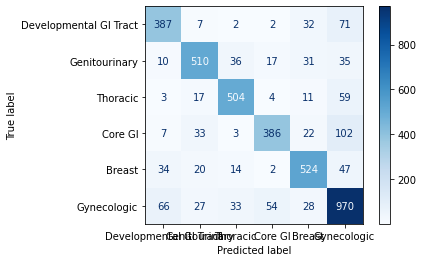

In [52]:
clf_rf = RandomForestClassifier(**grid_search.best_params_, random_state=4242)
clf_rf.fit(X_train,y_train)
predictions = clf_rf.predict(X_test)
feature_importances = pd.DataFrame(clf_rf.feature_importances_, index=X_train.columns,columns=['Importance']).sort_values('Importance',ascending=False)
report = pd.DataFrame((classification_report(y_test,predictions,labels=y_test.unique(),output_dict=True)))
round(report,3)
plot_confusion_matrix(clf_rf,X_test,y_test,display_labels=y_test.unique(),cmap=plt.cm.Blues,values_format='.3g')

In [53]:
report

,Developmental GI Tract,Genitourinary,Thoracic,Core GI,Breast,Gynecologic,accuracy,macro avg,weighted avg
precision,0.851351,0.830108,0.755452,0.830619,0.763314,0.808642,0.798297,0.806581,0.800390
recall,0.842809,0.698011,0.823430,0.798122,0.772455,0.817473,0.798297,0.792050,0.798297
f1-score,0.847059,0.758350,0.787977,0.814046,0.767857,0.813033,0.798297,0.798054,0.798095
support,598.000000,553.000000,1178.000000,639.000000,501.000000,641.000000,0.798297,4110.000000,4110.000000


6

In [85]:
plot_multiclass_roc(clf_rf, X_test, y_test, n_classes=len(clf_rf.classes_), figsize=(16, 10))

In [90]:
plot_multiclass_PR_curve(clf_rf,X_test,y_test,n_classes=len(clf_rf.classes_))

In [97]:
plot_feature_importances(feature_importances)

In [98]:
permutation_importances = PermutationImportance(clf_rf,n_iter=10).fit(X_test,y_test)
eli5.show_weights(permutation_importances,feature_names=clf_rf.feature_names_in_)

Weight,Feature
0.1294 ± 0.0092,KRAS_mutation
0.1150 ± 0.0043,APC_mutation
0.0935 ± 0.0079,Male
0.0420 ± 0.0051,Distant Mets: Pleura_Yes
0.0275 ± 0.0050,Distant Mets: Intra-Abdominal_Yes
0.0248 ± 0.0049,Distant Mets: Liver_Yes
0.0230 ± 0.0045,Distant Mets: Female Genital_Yes
0.0197 ± 0.0051,Distant Mets: CNS/Brain_Yes
0.0156 ± 0.0051,Overall Survival (Months)
0.0154 ± 0.0068,Mutation Count


In [99]:
df = eli5.explain_weights_df(permutation_importances)

In [100]:
df['feature'] = feature_importances.index
df.head(5)

,feature,weight,std
0,APC_mutation,0.129367,0.004596
1,KRAS_mutation,0.114988,0.002174
2,Age at Surgical Procedure,0.093528,0.003930
3,Male,0.042019,0.002533
4,TMB (nonsynonymous),0.027543,0.002486


In [104]:
fig = px.bar(df.head(10),x='feature', y='weight', error_y='std',color='feature',title='10 Most Important Features')
fig.update_xaxes(tickangle=45)
fig.show()
file_name = "FEAT_IMPORTANCE_WITH_PERM_"+str(clf_rf.base_estimator_)[:-2]+".png"
fig.write_image(os.path.join("images/",file_name))

In [108]:
show_correlated_top_features(feature_importances)

/home/erin/miniconda3/envs/superML_3.7/lib/python3.7/site-packages/ipykernel_launcher.py:5: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



In [ ]:
#TODO: make this more OOP

triple_mutants = raw_data.loc[(raw_data['TP53_mutation'] == 1.0) & (raw_data['APC_mutation'] == 1.0) & (raw_data['KRAS_mutation'] == 1.0)]
double_apc_kras = raw_data.loc[(raw_data['TP53_mutation'] == 0.0) & (raw_data['APC_mutation'] == 1.0) & (raw_data['KRAS_mutation'] == 1.0)]
double_apc_tp53 = raw_data.loc[(raw_data['TP53_mutation'] == 1.0) & (raw_data['APC_mutation'] == 1.0) & (raw_data['KRAS_mutation'] == 0.0)]
double_kras_tp53 = raw_data.loc[(raw_data['TP53_mutation'] == 1.0) & (raw_data['APC_mutation'] == 0.0) & (raw_data['KRAS_mutation'] == 1.0)]
single_apc = raw_data.loc[(raw_data['TP53_mutation'] == 0.0) & (raw_data['APC_mutation'] == 1.0) & (raw_data['KRAS_mutation'] == 0.0)]
single_kras = raw_data.loc[(raw_data['TP53_mutation'] == 0.0) & (raw_data['APC_mutation'] == 0.0) & (raw_data['KRAS_mutation'] == 1.0)]
single_tp53 = raw_data.loc[(raw_data['TP53_mutation'] == 1.0) & (raw_data['APC_mutation'] == 0.0) & (raw_data['KRAS_mutation'] == 0.0)]


In [ ]:
venn3(subsets = (single_kras['Patient ID'].nunique(), 
                 single_apc['Patient ID'].nunique(),
                 double_apc_kras['Patient ID'].nunique(),
                 single_tp53['Patient ID'].nunique(),
                 double_kras_tp53['Patient ID'].nunique(),
                 double_apc_tp53['Patient ID'].nunique(),
                 triple_mutants['Patient ID'].nunique(),
                 ),set_labels = ('KRAS', 'APC', 'TP53'))
plt.show()

In [ ]:
#RandomForest Regressor -- how well can we predict overall months of survival from our feature set?

In [ ]:
#data_for_ml.loc[data_for_ml['Organ System']]
X = data_for_ml.drop(columns=['Organ System','Overall Survival (Months)'])

y = data_for_ml['Overall Survival (Months)']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.33,random_state=4242)

print(X.shape)
print(X_train.shape)
print(y_train.shape)

In [ ]:
from sklearn.ensemble import RandomForestRegressor
rfr = RandomForestRegressor()
rfr.fit(X_train, y_train)

score = rfr.score(X_train, y_train)
print("R-squared:", score) 

In [ ]:
ypred = rfr.predict(X_test)

mse = mean_squared_error(y_test, ypred)
print("MSE: ", mse)
print("RMSE: ", mse*(1/2.0)) 

In [ ]:
# Create traces
x_ax = np.arange(len(y_test))

fig = go.Figure()
fig.add_trace(go.Scatter(x=x_ax, y=ypred, mode='lines',name='Predicted Data',fillcolor='royalblue', opacity=0.5))
fig.add_trace(go.Scatter(x=x_ax, y=y_test, mode='lines',name='Original Data',fillcolor='firebrick',opacity=0.5))
fig.show()

In [ ]:
feature_importances = pd.DataFrame(rfr.feature_importances_, index=X_train.columns,columns=['Importance']).sort_values('Importance',ascending=False)

In [ ]:
fig = px.bar(feature_importances,x=feature_importances.index,y='Importance',color=feature_importances.index)
fig.update_xaxes(tickangle=45)
fig.update_layout(autosize=False,
    width=1600,
    height=800,
    title='Feature Importance: All Features',)
fig.show()